<a href="https://colab.research.google.com/github/Arghaweeb/Self-Drving-Car/blob/main/Final_Behavorial_Cloning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [34]:
!git clone https://github.com/Arghaweeb/Self_Driving_Car_data-

fatal: destination path 'Self_Driving_Car_data-' already exists and is not an empty directory.


In [35]:
!ls Self_Driving_Car_data-

driving_log.csv  IMG


In [36]:
!pip3 install imgaug

In [37]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [38]:
datadir = 'Self_Driving_Car_data-'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data.head()

<ipython-input-38-5cebafcef464>:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\center_2023_12_15_10_19_30_375.jpg,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\left_2023_12_15_10_19_30_375.jpg,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\right_2023_12_15_10_19_30_375.jpg,0.0,0.0,0.0,0.657147
1,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\center_2023_12_15_10_19_30_478.jpg,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\left_2023_12_15_10_19_30_478.jpg,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\right_2023_12_15_10_19_30_478.jpg,0.0,0.0,0.0,0.650554
2,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\center_2023_12_15_10_19_30_584.jpg,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\left_2023_12_15_10_19_30_584.jpg,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\right_2023_12_15_10_19_30_584.jpg,0.0,0.0,0.0,0.644026
3,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\center_2023_12_15_10_19_30_689.jpg,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\left_2023_12_15_10_19_30_689.jpg,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\right_2023_12_15_10_19_30_689.jpg,0.0,0.0,0.0,0.637564
4,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\center_2023_12_15_10_19_30_792.jpg,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\left_2023_12_15_10_19_30_792.jpg,C:\Users\argha\OneDrive\Desktop\Data_Driving\IMG\right_2023_12_15_10_19_30_792.jpg,0.0,0.0,0.0,0.631167


In [39]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_12_15_10_19_30_375.jpg,left_2023_12_15_10_19_30_375.jpg,right_2023_12_15_10_19_30_375.jpg,0.0,0.0,0.0,0.657147
1,center_2023_12_15_10_19_30_478.jpg,left_2023_12_15_10_19_30_478.jpg,right_2023_12_15_10_19_30_478.jpg,0.0,0.0,0.0,0.650554
2,center_2023_12_15_10_19_30_584.jpg,left_2023_12_15_10_19_30_584.jpg,right_2023_12_15_10_19_30_584.jpg,0.0,0.0,0.0,0.644026
3,center_2023_12_15_10_19_30_689.jpg,left_2023_12_15_10_19_30_689.jpg,right_2023_12_15_10_19_30_689.jpg,0.0,0.0,0.0,0.637564
4,center_2023_12_15_10_19_30_792.jpg,left_2023_12_15_10_19_30_792.jpg,right_2023_12_15_10_19_30_792.jpg,0.0,0.0,0.0,0.631167


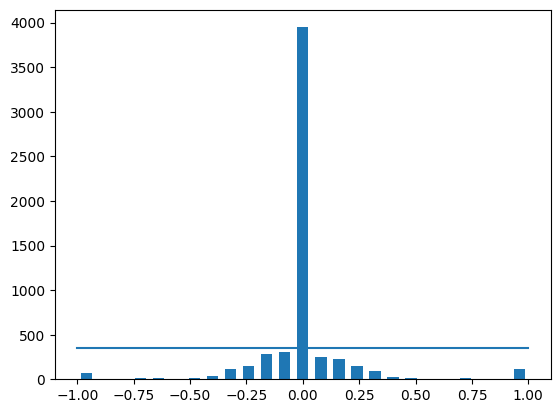

In [40]:
num_bins = 25
samples_per_bin = 350
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

Total Data: 5872
Removed 3598
remaining 2274


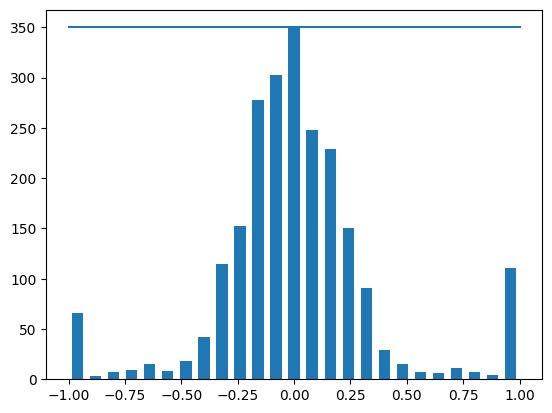

In [41]:
print('Total Data:', len(data))
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('Removed', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [42]:
print(data.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2023_12_15_10_19_32_466.jpg
left        left_2023_12_15_10_19_32_466.jpg  
right       right_2023_12_15_10_19_32_466.jpg 
steering   -0.196199                          
throttle    1.0                               
reverse     0.0                               
speed       14.38654                          
Name: 20, dtype: object


In [43]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 5457
Valid Samples: 1365


Text(0.5, 1.0, 'Validation set')

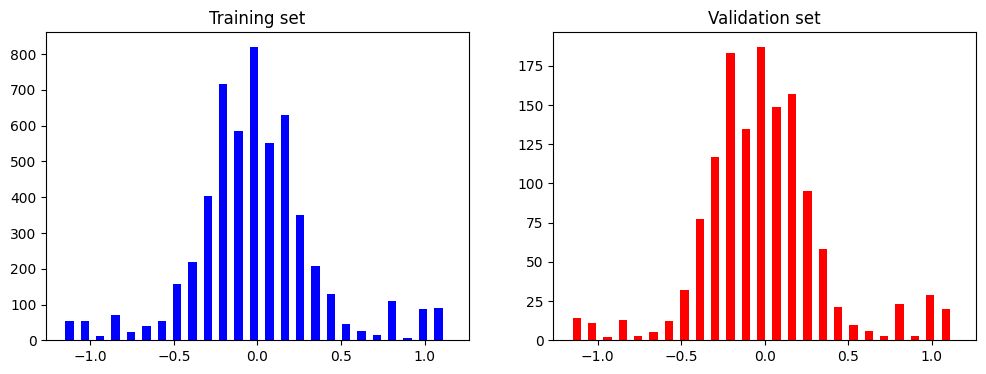

In [44]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Image Augmentation

In [45]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

Text(0.5, 1.0, 'Zoomed Image')

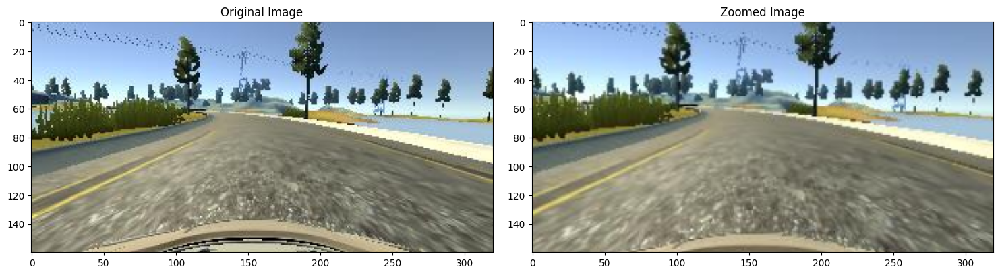

In [46]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')


In [47]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

Text(0.5, 1.0, 'Panned Image')

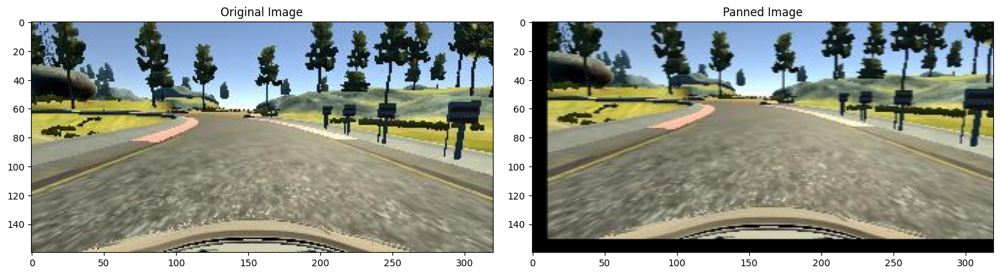

In [48]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

In [49]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

Text(0.5, 1.0, 'Brightness altered image ')

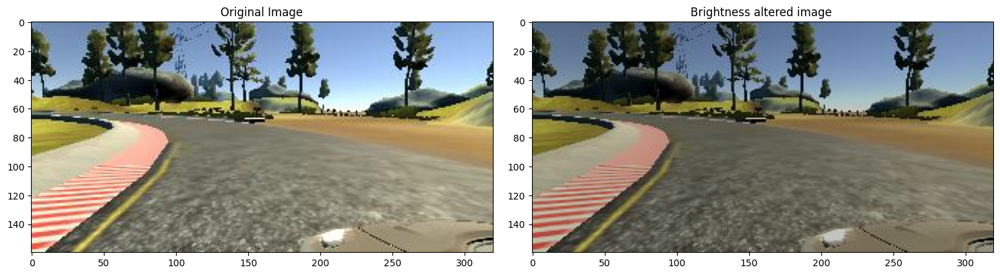

In [50]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')


In [51]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-0.15')

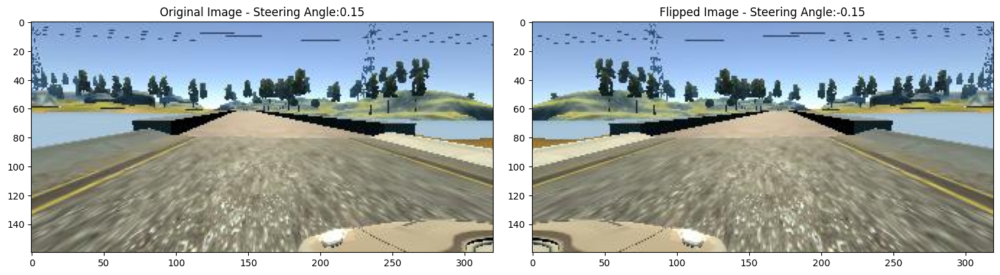

In [52]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [53]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

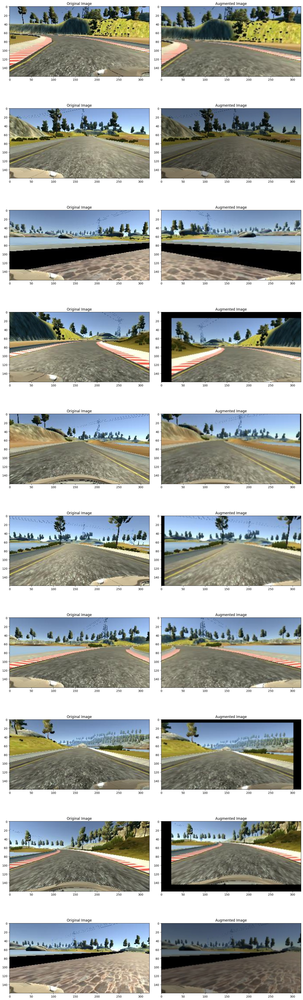

In [54]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [55]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

Text(0.5, 1.0, 'Preprocessed Image')

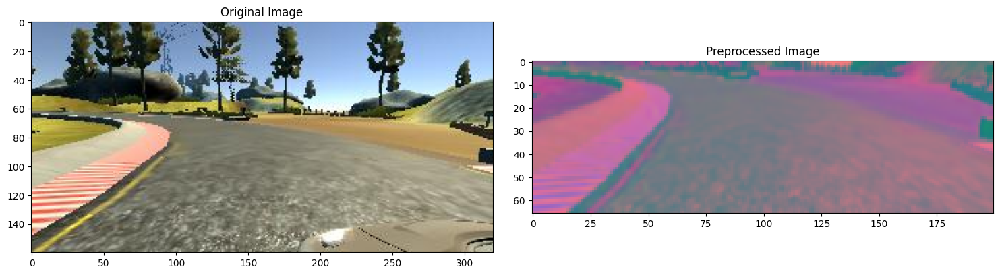

In [56]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [57]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

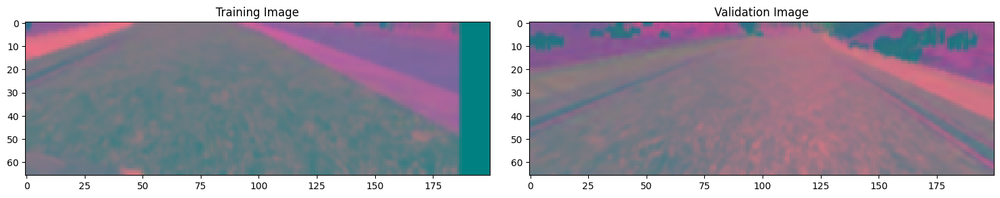

In [58]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

**NVIDIA MODEL**

In [59]:
def nvidia_model():

 model = Sequential()

 model.add(Conv2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66,200,3),activation='elu'))

 model.add(Conv2D(36, kernel_size=(5,5), strides=(2,2), activation='elu'))
 model.add(Conv2D(48, kernel_size=(5,5), strides=(2,2), activation='elu'))
 model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
 model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
 #model.add(Dropout(0.5))


 model.add(Flatten())
 model.add(Dense(100, activation='elu'))
 #model.add(Dropout(0.5))


 model.add(Dense(50, activation='elu'))
 #model.add(Dropout(0.5))

 model.add(Dense(10, activation ='elu'))
 #model.add(Dropout(0.5))
 model.add(Dense(1))


 optimizer= Adam(learning_rate=1e-4)
 model.compile(loss='mse', optimizer=optimizer)

 return model

In [60]:
model = nvidia_model()
print(model.summary())

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_6 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_7 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_8 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_9 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten_1 (Flatten)         (None, 1152)              0         
                                                                 
 dense_4 (Dense)             (None, 100)              

In [61]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

<ipython-input-61-d2583482fce6>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 144s 458ms/step - loss: 0.1321 - val_loss: 0.1147
Epoch 2/10
300/300 [==============================] - 115s 385ms/step - loss: 0.1186 - val_loss: 0.0956
Epoch 3/10
300/300 [==============================] - 115s 385ms/step - loss: 0.1093 - val_loss: 0.0808
Epoch 4/10
300/300 [==============================] - 116s 387ms/step - loss: 0.0972 - val_loss: 0.0686
Epoch 5/10
300/300 [==============================] - 120s 400ms/step - loss: 0.0908 - val_loss: 0.0653
Epoch 6/10
300/300 [==============================] - 161s 539ms/step - loss: 0.0881 - val_loss: 0.0623
Epoch 7/10
300/300 [==============================] - 150s 502ms/step - loss: 0.0804 - val_loss: 0.0578
Epoch 8/10
300/300 [==============================] - 132s 442ms/step - loss: 0.0789 - val_loss: 0.0566
Epoch 9/10
300/300 [==============================] - 104s 348ms/step - loss: 0.0762 - val_loss: 0.0505
Epoch 10/10
300/300 [==============================] - 138s 463m

Text(0.5, 0, 'Epoch')

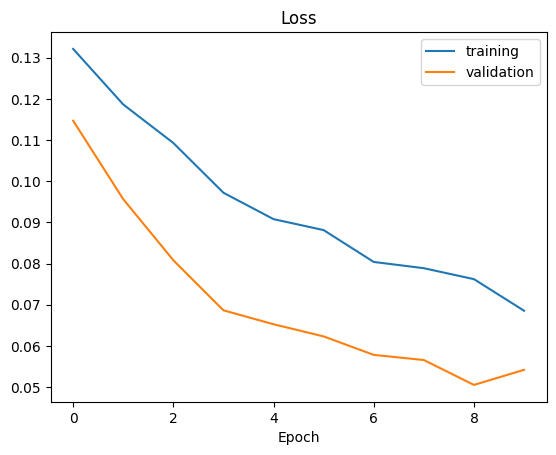

In [62]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [63]:
model.save('model.h5')
from google.colab import files
files.download('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>